DSCI 552 Homework 1 Zeru Zhou Github username: Zeruuuuu USCID: 9208-8181-38

# 1. Multi-class and Multi-Label Classification Using Support Vector Machines
## (a) Download the Anuran Calls (MFCCs) Data Set from: https://archive.ics. uci.edu/ml/datasets/Anuran+Calls+%28MFCCs%29. Choose 70% of the data randomly as the training set.

In [186]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from math import e
from sklearn.model_selection import GridSearchCV
from sklearn.svm import LinearSVC
from sklearn.metrics import hamming_loss
from sklearn.preprocessing import StandardScaler
import warnings
from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from collections import Counter

In [3]:
my_df = pd.read_csv('../data/Anuran Calls (MFCCs)/Frogs_MFCCs.csv')
my_df.head()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family,Genus,Species,RecordID
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,Leptodactylidae,Adenomera,AdenomeraAndre,1
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,Leptodactylidae,Adenomera,AdenomeraAndre,1
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,Leptodactylidae,Adenomera,AdenomeraAndre,1
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,Leptodactylidae,Adenomera,AdenomeraAndre,1
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,Leptodactylidae,Adenomera,AdenomeraAndre,1


In [4]:
my_df.shape

(7195, 26)

In [10]:
train, test = train_test_split(my_df, train_size = 0.7)
train.shape, test.shape

((5036, 26), (2159, 26))

As above, data is read and splited

## (b) Each instance has three labels: Families, Genus, and Species. Each of the labels has multiple classes. We wish to solve a multi-class and multi-label problem. One of the most important approaches to multi-label classification is to train a classifier for each label (binary relevance). We first try this approach:

### i. Research exact match and hamming score/ loss methods for evaluating multi- label classification and use them in evaluating the classifiers in this problem.


Exact match is the accuracy that the predicted labels exactly match the true set of labels, in multi-label tasks. However, that might be too strict since there could be many labels and is hard to match each of them correctly. The Hamming loss is the fraction of the wrong labels over the total number of labels, which losen the standard in multi-label classification.

### ii. Train a SVM for each of the labels, using Gaussian kernels and one versus all classifiers. Determine the weight of the SVM penalty and the width of the Gaussian Kernel using 10 fold cross validation.1 You are welcome to try to solve the problem with both standardized 2 and raw attributes and report the results.

### Label 1: Families

In [11]:
train_x = train.drop(columns = ['Family','Genus', 'Species', 'RecordID'])
test_x = test.drop(columns = ['Family','Genus', 'Species', 'RecordID'])
train_family = train['Family']

In [22]:
svc = SVC(kernel = 'rbf', decision_function_shape = 'ovr')

In [58]:
params = {'C': np.logspace(-4, 6, 9, base = e), 'gamma': np.logspace(-7, 3, 9, base = e)}

In [49]:
clf = GridSearchCV(svc, params, cv = 10).fit(train_x, train_family)

In [50]:
clf.best_score_, clf.best_params_

(0.9926528132790559, {'C': 20.085536923187664, 'gamma': 2.718281828459045})

In [54]:
test_family = test['Family']
print(f'The accuracy score is {clf.score(test_x, test_family)}')

The accuracy score is 0.9944418712366836


In [68]:
family_pred = clf.predict(test_x)
Ham_loss_family = hamming_loss(test_family, family_pred)
print(f'Hamming loss is {Ham_loss_family}' )

Hamming loss is 0.00555812876331635


### Label 2: Genus

In [55]:
train_genus = train['Genus']

In [57]:
clf_genus = GridSearchCV(svc, params, cv = 10).fit(train_x, train_genus)

In [59]:
clf_genus.best_score_, clf_genus.best_params_

(0.9900695036132412, {'C': 148.41315910257657, 'gamma': 1.0})

In [60]:
test_genus = test['Genus']
print(f'The accuracy score is {clf_genus.score(test_x, test_genus)}')

The accuracy score is 0.9911996294580825


In [69]:
genus_pred = clf_genus.predict(test_x)
Ham_loss_genus = hamming_loss(test_genus, genus_pred)
print(f'Hamming loss is {Ham_loss_genus}' )

Hamming loss is 0.008800370541917554


### Label 3: Species

In [61]:
train_species = train['Species']

In [62]:
clf_species = GridSearchCV(svc, params, cv = 10).fit(train_x, train_species)

In [65]:
clf_species.best_score_, clf_species.best_params_

(0.9886806147243524, {'C': 9.487735836358524, 'gamma': 1.6487212707001282})

In [66]:
test_species = test['Species']
print(f'The accuracy score is {clf_species.score(test_x, test_species)}')

The accuracy score is 0.9911996294580825


In [70]:
species_pred = clf_species.predict(test_x)
Ham_loss_species = hamming_loss(test_species, species_pred)
print(f'Hamming loss is {Ham_loss_species}' )

Hamming loss is 0.008800370541917554


As above, three classifier are generated and best C, gamma are selected. I calculated exact match(accuracy score), and hamming loss for each model.

### iii. Repeat 1(b)ii with L1-penalized SVMs. Remember to standardize the attributes. Determine the weight of the SVM penalty using 10 fold cross validation.

In [72]:
train_x_std = StandardScaler().fit_transform(train_x)
test_x_std = StandardScaler().fit_transform(test_x)

In [79]:
lsvc = LinearSVC(penalty = 'l1', dual = False, max_iter = 3000)

In [75]:
params = {'C': np.logspace(-5, 8, 14, base = e)}

### Label1: Families

In [83]:
clf = GridSearchCV(lsvc, params, cv = 10).fit(train_x_std, train_family)

In [84]:
clf.best_score_, clf.best_params_

(0.9306999274196095, {'C': 0.36787944117144233})

In [85]:
test_family = test['Family']
print(f'The accuracy score is {clf.score(test_x_std, test_family)}')

The accuracy score is 0.9416396479851783


In [86]:
family_pred = clf.predict(test_x_std)
Ham_loss_family = hamming_loss(test_family, family_pred)
print(f'Hamming loss is {Ham_loss_family}' )

Hamming loss is 0.058360352014821676


### Label2: Genus

In [87]:
train_genus = train['Genus']

In [88]:
clf_genus = GridSearchCV(lsvc, params, cv = 10).fit(train_x_std, train_genus)

In [89]:
clf_genus.best_score_, clf_genus.best_params_

(0.9531355517687524, {'C': 7.3890560989306495})

In [90]:
test_genus = test['Genus']
print(f'The accuracy score is {clf_genus.score(test_x_std, test_genus)}')

The accuracy score is 0.9499768411301528


In [91]:
genus_pred = clf_genus.predict(test_x_std)
Ham_loss_genus = hamming_loss(test_genus, genus_pred)
print(f'Hamming loss is {Ham_loss_genus}' )

Hamming loss is 0.05002315886984715


### Label3: Species

In [92]:
train_species = train['Species']

In [93]:
clf_species = GridSearchCV(lsvc, params, cv = 10).fit(train_x_std, train_species)

In [94]:
clf_species.best_score_, clf_species.best_params_

(0.9577041717946291, {'C': 54.59815003314423})

In [95]:
test_species = test['Species']
print(f'The accuracy score is {clf_species.score(test_x_std, test_species)}')

The accuracy score is 0.9597035664659564


In [96]:
species_pred = clf_species.predict(test_x_std)
Ham_loss_species = hamming_loss(test_species, species_pred)
print(f'Hamming loss is {Ham_loss_species}' )

Hamming loss is 0.04029643353404354


As above, I used L1-penalized SVC and displayed the exact score(Accuracy) and Hamming Loss.

### iv. Repeat 1(b)iii by using SMOTE or any other method you know to remedy class imbalance. Report your conclusions about the classifiers you trained.

In [99]:
pip = Pipeline(steps = [('smote', SMOTE(random_state = 42)), ('model', lsvc)])
params = {'model__C': np.logspace(-5, 8, 14, base = e)}

### Label1: Families

In [100]:
clf = GridSearchCV(pip, params, cv = 10).fit(train_x_std, train_family)
clf.best_score_, clf.best_params_

(0.9193844867304112, {'model__C': 7.3890560989306495})

In [101]:
test_family = test['Family']
print(f'The accuracy score is {clf.score(test_x_std, test_family)}')

The accuracy score is 0.9258916164891153


In [102]:
family_pred = clf.predict(test_x_std)
Ham_loss_family = hamming_loss(test_family, family_pred)
print(f'Hamming loss is {Ham_loss_family}' )

Hamming loss is 0.07410838351088467


### Label2: Genus

In [103]:
train_genus = train['Genus']

In [104]:
clf_genus = GridSearchCV(pip, params, cv = 10).fit(train_x_std, train_genus)

In [105]:
clf_genus.best_score_, clf_genus.best_params_

(0.9156055729117358, {'model__C': 1.0})

In [106]:
test_genus = test['Genus']
print(f'The accuracy score is {clf_genus.score(test_x_std, test_genus)}')

The accuracy score is 0.9152385363594256


In [107]:
genus_pred = clf_genus.predict(test_x_std)
Ham_loss_genus = hamming_loss(test_genus, genus_pred)
print(f'Hamming loss is {Ham_loss_genus}' )

Hamming loss is 0.08476146364057434


### Label3: Species

In [108]:
train_species = train['Species']

In [109]:
clf_species = GridSearchCV(pip, params, cv = 10).fit(train_x_std, train_species)

In [110]:
clf_species.best_score_, clf_species.best_params_

(0.9535371106693173, {'model__C': 2.718281828459045})

In [111]:
test_species = test['Species']
print(f'The accuracy score is {clf_species.score(test_x_std, test_species)}')

The accuracy score is 0.9559981472904122


In [112]:
species_pred = clf_species.predict(test_x_std)
Ham_loss_species = hamming_loss(test_species, species_pred)
print(f'Hamming loss is {Ham_loss_species}' )

Hamming loss is 0.04400185270958777


In this question rbf kernal performed much better than linear kernal, in all of the three labels. Also, the exact score and hamming loss seem to be better when we perform l1-regularization without SMOTE than with SMOTE.

## 2. K-Means Clustering on a Multi-Class and Multi-Label Data Set Monte-Carlo Simulation: Perform the following procedures 50 times, and report the average and standard deviation of the 50 Hamming Distances that you calculate.

## Let's do everything once first. I'll repeat 50 times after that.

### (a) Use k-means clustering on the whole Anuran Calls (MFCCs) Data Set (do not split the data into train and test, as we are not performing supervised learning in this exercise). Choose k ∈ {1, 2, . . . , 50} automatically based on one of the methods provided in the slides (CH or Gap Statistics or scree plots or Silhouettes) or any other method you know.

In [117]:
x = my_df.drop(columns = ['Family', 'Genus', 'Species', 'RecordID'])
x.shape

(7195, 22)

In [187]:
def get_cluster(max_score = -999, n_clusters = 0):
    for n in range(2,52):
        kmeans = KMeans(n_clusters = n)
        y_pred = kmeans.fit_predict(x)
        silhouette = silhouette_score(x,y_pred)
        if max_score < silhouette:
            max_score = silhouette
        if max_score == silhouette:
            n_clusters = n
    return max_score, n_clusters

score, n = get_cluster()
score, n

(0.38523395202479643, 4)

As we can see, the optimal cluster number is 4 by Silhouette.

### (b) In each cluster, determine which family is the majority by reading the true labels. Repeat for genus and species.

In [128]:
clf = KMeans(n_clusters = n).fit(x)
Counter(clf.labels_)

Counter({2: 1031, 0: 1982, 3: 614, 1: 3568})

In [133]:
my_label = pd.Series(clf.labels_)
my_label

0       2
1       2
2       2
3       2
4       2
       ..
7190    2
7191    2
7192    2
7193    2
7194    2
Length: 7195, dtype: int32

In [137]:
index_list = []
for i in range(n):
    index_list.append(my_label[my_label == i].index.tolist())

In [150]:
family = []
genus = []
species = []
for i in range(len(index_list)):
    family.append(my_df.loc[index_list[i],:]['Family'].value_counts().index[0])
    genus.append(my_df.loc[index_list[i],:]['Genus'].value_counts().index[0])
    species.append(my_df.loc[index_list[i],:]['Species'].value_counts().index[0])
major = pd.DataFrame({'family': family, 'genus': genus, 'species': species})
major

,family,genus,species
0,Hylidae,Hypsiboas,HypsiboasCordobae
1,Leptodactylidae,Adenomera,AdenomeraHylaedactylus
2,Dendrobatidae,Ameerega,Ameeregatrivittata
3,Hylidae,Hypsiboas,HypsiboasCinerascens


As above, I got the majority labels for each clusters

### (c) Now for each cluster you have a majority label triplet (family, genus, species). Calculate the average Hamming distance, Hamming score, and Hamming loss5 between the true labels and the labels assigned by clusters.


In [156]:
for i in range(len(index_list)):
    my_df.loc[index_list[i],'Family_pred'] = major.loc[i,'family']
    my_df.loc[index_list[i],'Genus_pred'] = major.loc[i,'genus']
    my_df.loc[index_list[i],'Species_pred'] = major.loc[i,'species']

In [157]:
my_df.head()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_20,MFCCs_21,MFCCs_22,Family,Genus,Species,RecordID,Family_pred,Genus_pred,Species_pred
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,0.057684,0.118680,0.014038,Leptodactylidae,Adenomera,AdenomeraAndre,1,Dendrobatidae,Ameerega,Ameeregatrivittata
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,0.020140,0.082263,0.029056,Leptodactylidae,Adenomera,AdenomeraAndre,1,Dendrobatidae,Ameerega,Ameeregatrivittata
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.025083,0.099108,0.077162,Leptodactylidae,Adenomera,AdenomeraAndre,1,Dendrobatidae,Ameerega,Ameeregatrivittata
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,-0.054766,-0.018691,0.023954,Leptodactylidae,Adenomera,AdenomeraAndre,1,Dendrobatidae,Ameerega,Ameeregatrivittata
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,-0.031346,0.108610,0.079244,Leptodactylidae,Adenomera,AdenomeraAndre,1,Dendrobatidae,Ameerega,Ameeregatrivittata


In [171]:
avg_ham_loss = (hamming_loss(my_df['Family'], my_df['Family_pred']) + hamming_loss(my_df['Genus'], 
    my_df['Genus_pred']) + hamming_loss(my_df['Species'], my_df['Species_pred']))/3
print(f' The average hamming loss is {avg_ham_loss}')

 The average hamming loss is 0.22242297892054666


In [172]:
avg_ham_score = 1 - avg_ham_loss
print(f' The average hamming score is {avg_ham_score}')

 The average hamming score is 0.7775770210794534


In [174]:
def get_hamming_distance():
    count = 0
    pred = ['Family_pred', 'Genus_pred', 'Species_pred']
    for n,i in enumerate(['Family', 'Genus', 'Species']):
        for j in range(len(my_df)):
            if my_df.loc[j, i] != my_df.loc[j, pred[n]]:
                count += 1
    return count/3
avg_hamming_distance = get_hamming_distance()
print(f' The average hamming distance is {avg_hamming_distance}')

 The average hamming distance is 1600.3333333333333


As above, I got the average hamming loss, hamming score, and hamming distance.

## Monte-Carlo Simulation for 50 times:

In [188]:
hamming_distance = []
hamming_los = []
hamming_score = []
k = []
for m in range(50):
    score, n = get_cluster()
    k.append(n)
    clf = KMeans(n_clusters = n).fit(x)
    my_label = pd.Series(clf.labels_)
    index_list = []
    for i in range(n):
        index_list.append(my_label[my_label == i].index.tolist())
    family = []
    genus = []
    species = []
    for i in range(len(index_list)):
        family.append(my_df.loc[index_list[i],:]['Family'].value_counts().index[0])
        genus.append(my_df.loc[index_list[i],:]['Genus'].value_counts().index[0])
        species.append(my_df.loc[index_list[i],:]['Species'].value_counts().index[0])
    major = pd.DataFrame({'family': family, 'genus': genus, 'species': species})
    for i in range(len(index_list)):
        my_df.loc[index_list[i],'Family_pred'] = major.loc[i,'family']
        my_df.loc[index_list[i],'Genus_pred'] = major.loc[i,'genus']
        my_df.loc[index_list[i],'Species_pred'] = major.loc[i,'species']
    hamming_los.append((hamming_loss(my_df['Family'], my_df['Family_pred']) + hamming_loss(my_df['Genus'], 
    my_df['Genus_pred']) + hamming_loss(my_df['Species'], my_df['Species_pred']))/3)
    hamming_score.append(1 - (hamming_loss(my_df['Family'], my_df['Family_pred']) + hamming_loss(my_df['Genus'], 
    my_df['Genus_pred']) + hamming_loss(my_df['Species'], my_df['Species_pred']))/3)
    hamming_distance.append(get_hamming_distance())
monte_carlo = pd.DataFrame({'k': k, 'avg hamming loss': hamming_los, 'avg hamming score': hamming_score, 
                           'avg hamming distance': hamming_distance})
monte_carlo

,k,avg hamming loss,avg hamming score,avg hamming distance
0,4,0.222423,0.777577,1600.333333
1,4,0.222423,0.777577,1600.333333
2,4,0.222423,0.777577,1600.333333
3,4,0.222423,0.777577,1600.333333
4,4,0.222423,0.777577,1600.333333
5,4,0.222423,0.777577,1600.333333
6,4,0.222423,0.777577,1600.333333
7,4,0.222423,0.777577,1600.333333
8,4,0.222423,0.777577,1600.333333
9,4,0.222423,0.777577,1600.333333


In [192]:
print(f'The mean of 50 iterations is {np.mean(monte_carlo["avg hamming distance"])}')

The mean of 50 iterations is 1600.333333333333


In [194]:
print(f'The standard deviation of 50 iterations is {np.std(monte_carlo["avg hamming distance"])}')

The standard deviation of 50 iterations is 2.2737367544323206e-13


# ISLR 12.6.2

## (a)

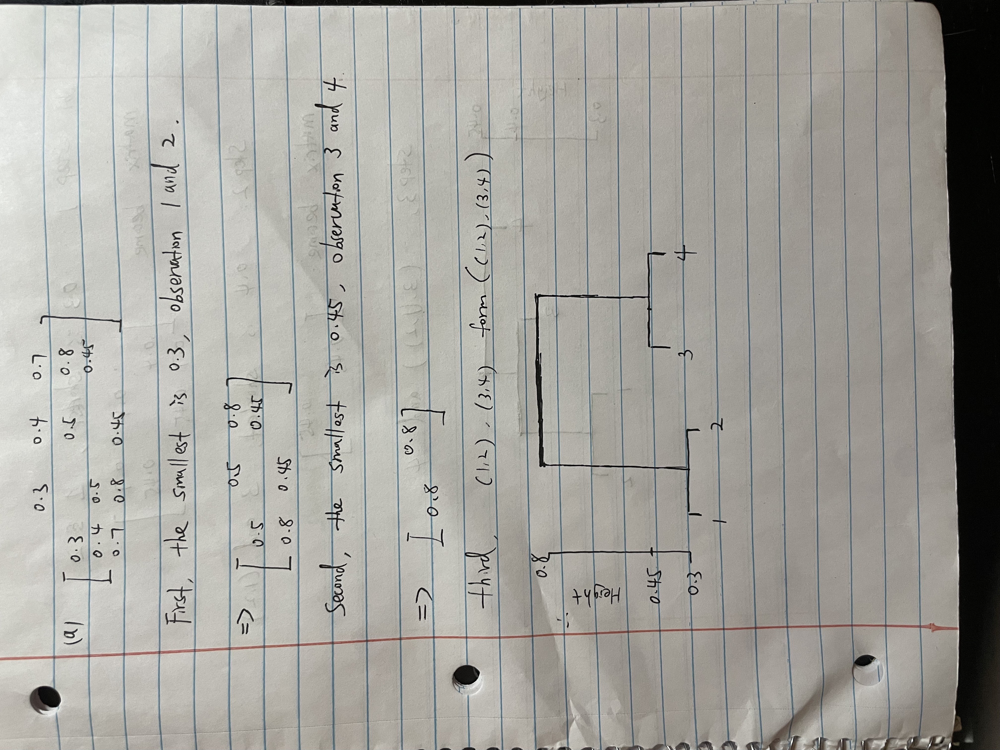

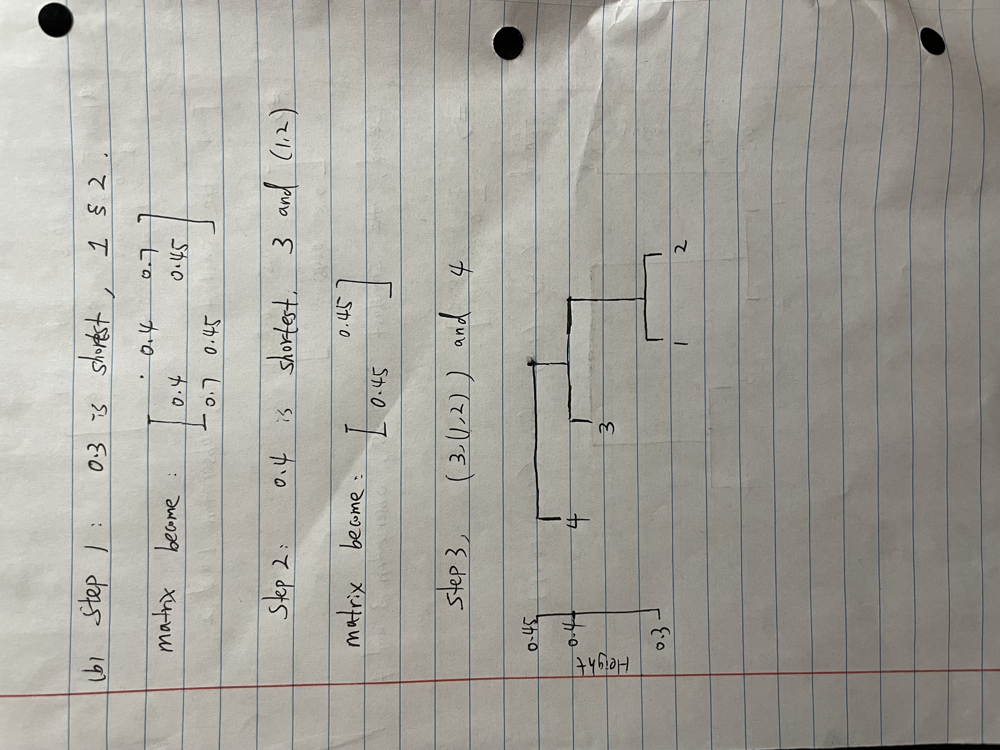

### (c)  In this case, we have clusters (1,2) and (3,4), by cutting dendrogram to 2 clusters.

### (d)  In this case, we have clusters ((1,2),3) and (4), by cutting dendrogram to 2 clusters.

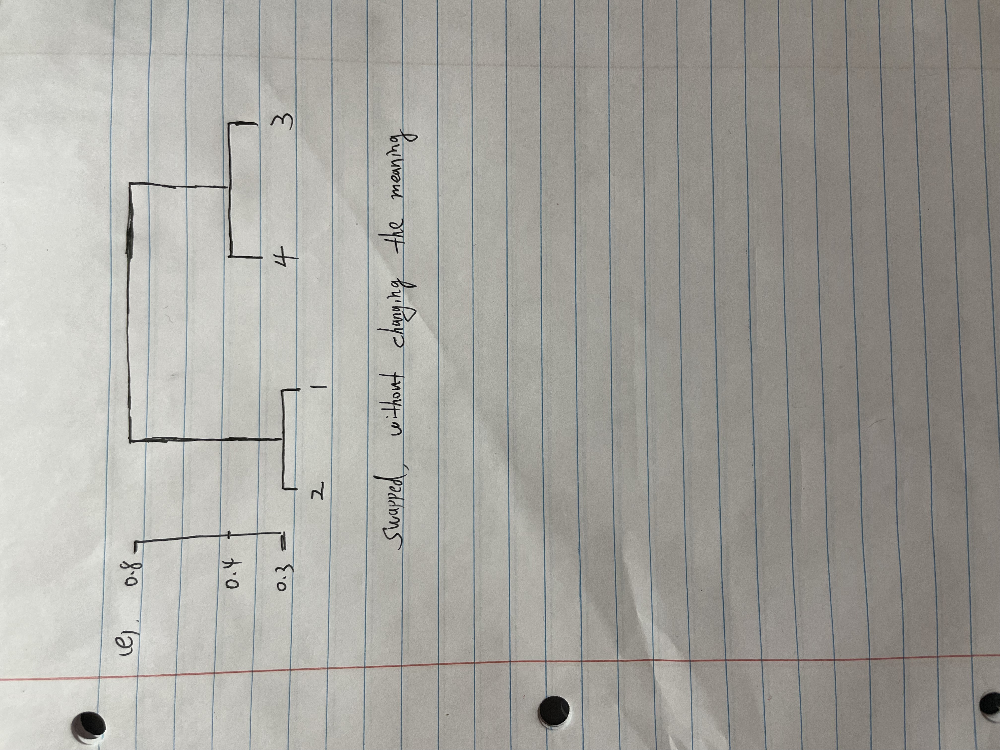